In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import pickle
import markov_clustering as mc
import random
from tqdm import tqdm_notebook as tqdm
import os
import git
import pandas as pd
import ast

In [8]:
def get_git_root(path):
    git_repo = git.Repo(path, search_parent_directories=True)
    git_root = git_repo.git.rev_parse("--show-toplevel")
    return git_root

In [9]:
# edgelist_path = os.path.join(get_git_root(os.getcwd()),"models","user-user_c.edgelist")
model_dir = os.path.join(get_git_root(os.getcwd()),"models")

In [62]:
poly_users_path = os.path.join(get_git_root(os.getcwd()),"models","poly_users")
poly_users = pickle.load(open(os.path.join(poly_users_path,"poly_users.pkl"),"rb"))
total_users = pickle.load(open(os.path.join(poly_users_path,"normal_users.pkl"),"rb"))
input_dir = os.path.join(get_git_root(os.getcwd()),"input")

In [63]:
df_following_final = pd.read_csv(os.path.join(input_dir,"following_final.csv"))

In [95]:
len(set(total_users))

3177

In [97]:
len(poly_users)

979

In [93]:
len(set(poly_users).intersection(set(total_users)))

979

In [66]:
mono_users = list(set(total_users) - set(poly_users))

In [67]:
len(mono_users)

2198

In [68]:
## selecting a subset of the following that contain the total users
df_poly_users = df_following_final[df_following_final.userID.isin(poly_users)]
df_mono_users = df_following_final[df_following_final.userID.isin(mono_users)]
df_all_users = df_following_final[df_following_final.userID.isin(total_users)]

In [69]:
### building the network
def get_graph(df):
    G = nx.DiGraph()
    users = list(df.userID.unique())
    for user in tqdm(users):
        following_A = set(ast.literal_eval((df.loc[df.userID == user].head(1)["following"].values)[0]))
        user_set = set([node for node in users if node != user])
        users_list = user_set.intersection(following_A)
        for user_following in list(users_list):
            G.add_edge(user,user_following)
    return G

In [70]:
G_poly = get_graph(df_poly_users)
G_mono = get_graph(df_mono_users)

In [71]:
G_all = get_graph(df_all_users)

In [164]:
G_p = G_poly.to_undirected()
nx.clustering(G_p)

{15247690: 0,
 14662354: 0.03694581280788178,
 18333645: 0,
 24200759: 0,
 3089999993: 0,
 24288307: 0.09538461538461539,
 308703664: 0.41358641358641357,
 28740748: 0,
 3053923379: 1.0,
 2989669784: 0.11067193675889328,
 2410201324: 0.1111111111111111,
 1026512202: 0.8390243902439024,
 109702657: 0.5551114341085271,
 1726319492: 0.5243837935047075,
 273362692: 0.5989218328840971,
 115489670: 0.42389351625020416,
 17454993: 0.5371029767839339,
 2218512020: 0.41253869969040247,
 2446121772: 0.4514066496163683,
 20082486: 0.5437196391394865,
 205212092: 0.4531987977672821,
 157067455: 0.5293557600761662,
 3428834122: 0.5541254572551145,
 15149899: 0.5259449939032651,
 403908693: 0.28527131782945736,
 131901537: 0.4101592851592852,
 2903624296: 0.6465339739190117,
 2647435753: 0.4791051454138702,
 21361003: 0.5105257590183011,
 2910321650: 0.45303241547577555,
 44212339: 0.37236774524910116,
 2567782003: 0.3456484479146829,
 25892722: 0.5250593675790526,
 1870295029: 0.4197108066971081,
 

In [35]:
# color map 
color_map = list()
for node in G_poly.nodes():
    if int(node) in poly_users:
        color_map.append('green')
    else:
        color_map.append('blue')

In [39]:
len(G_mono.nodes())

702

In [38]:
len(G_mono.edges())

3140

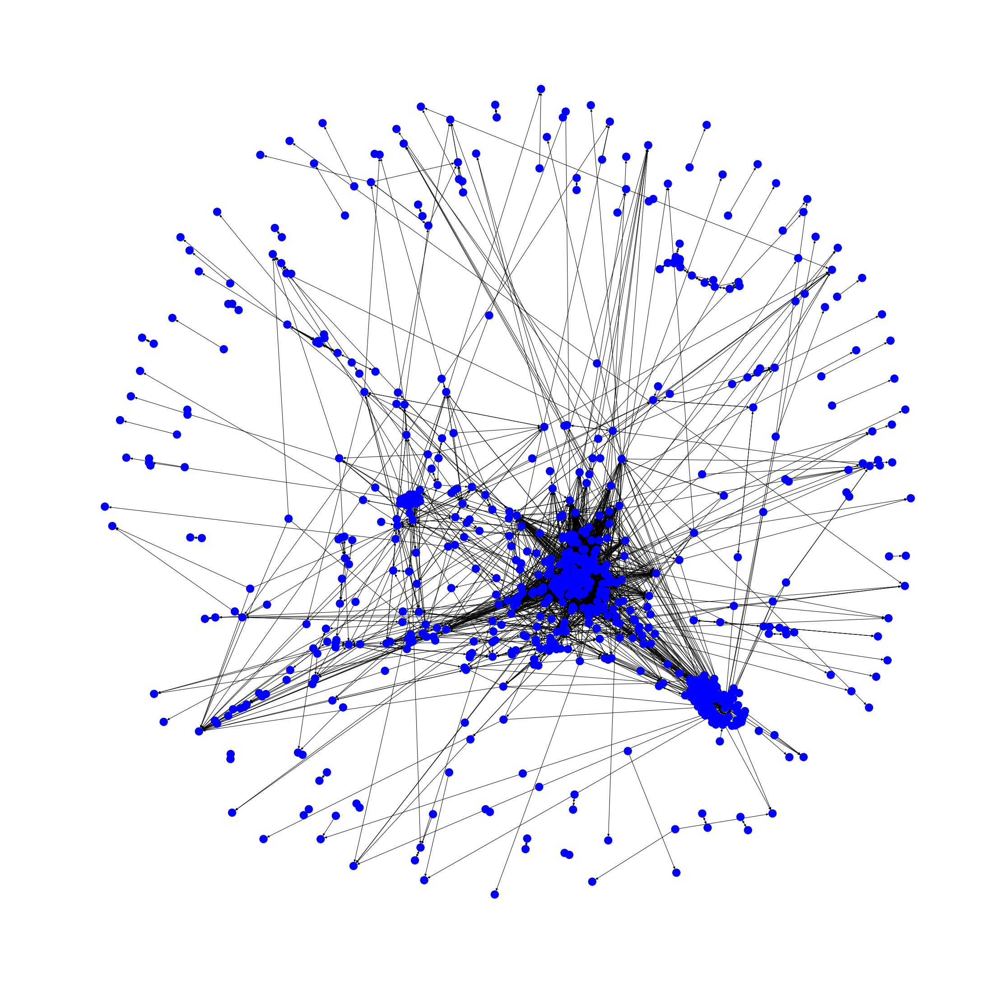

In [34]:
## mono viz --(filetersd)
plt.figure(figsize=(30,30))
nx.draw(G_mono,node_color=color_map)

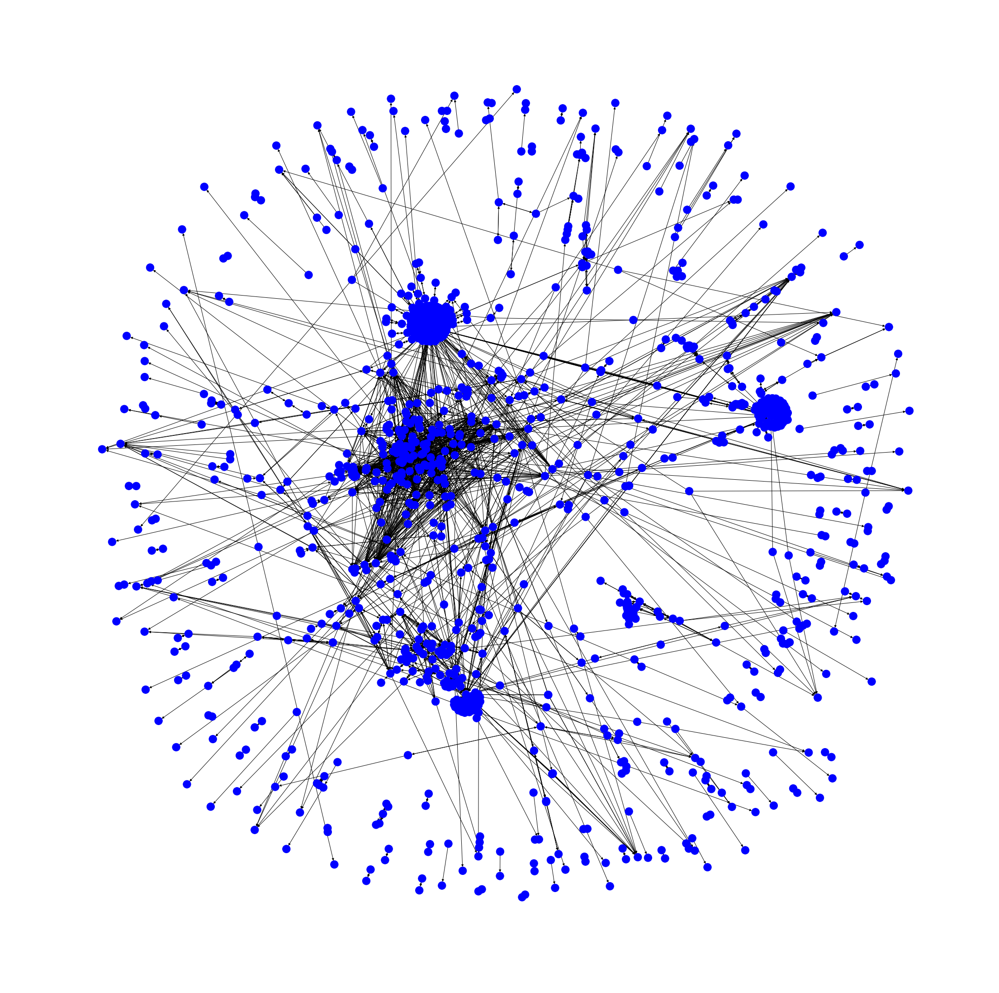

In [64]:
## mono viz
plt.figure(figsize=(30,30))
nx.draw(G,node_color=color_map)

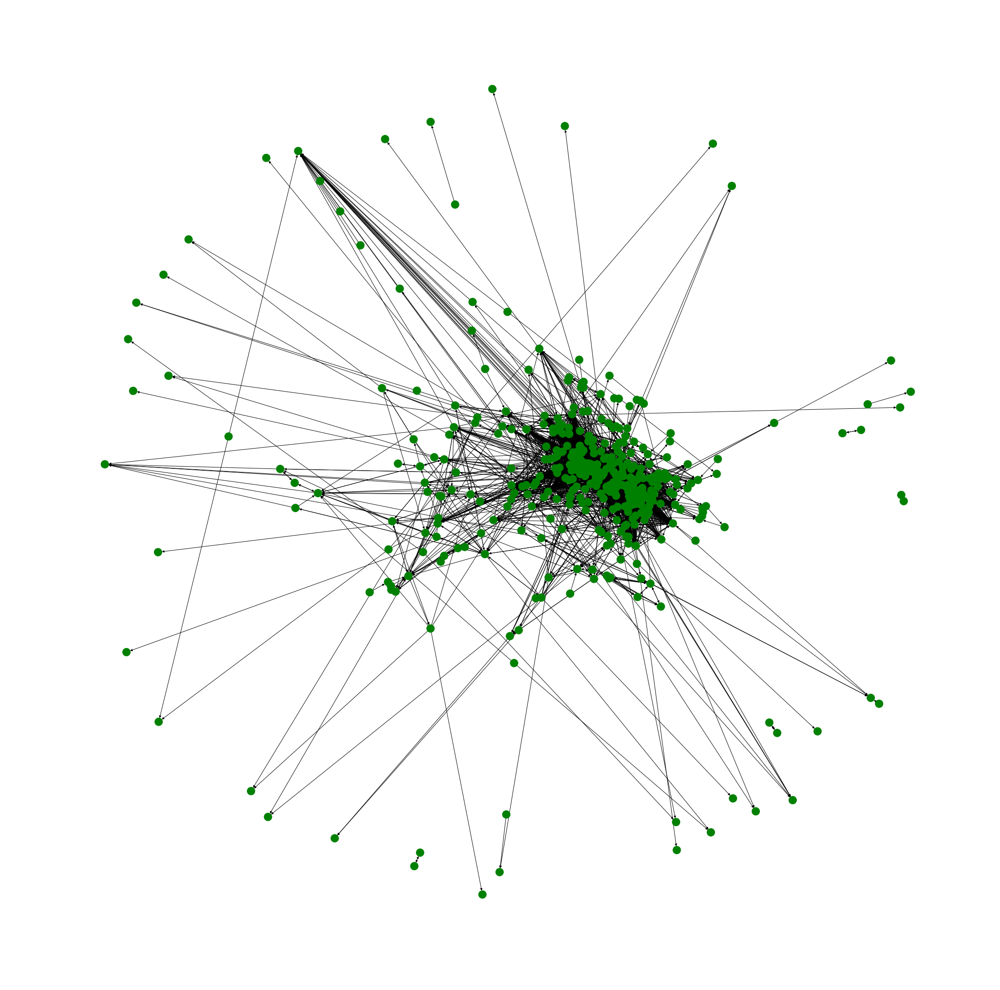

In [40]:
## poly_viz -- filtered
plt.figure(figsize=(30,30))
nx.draw(G_poly,node_color=color_map)
# plt.savefig(os.path.join(model_dir,"poly_users","following_network.pdf"))

In [45]:
print("nodes", len(G_poly.nodes()))
print("edges", len(G_poly.edges()))

nodes 421
edges 4450


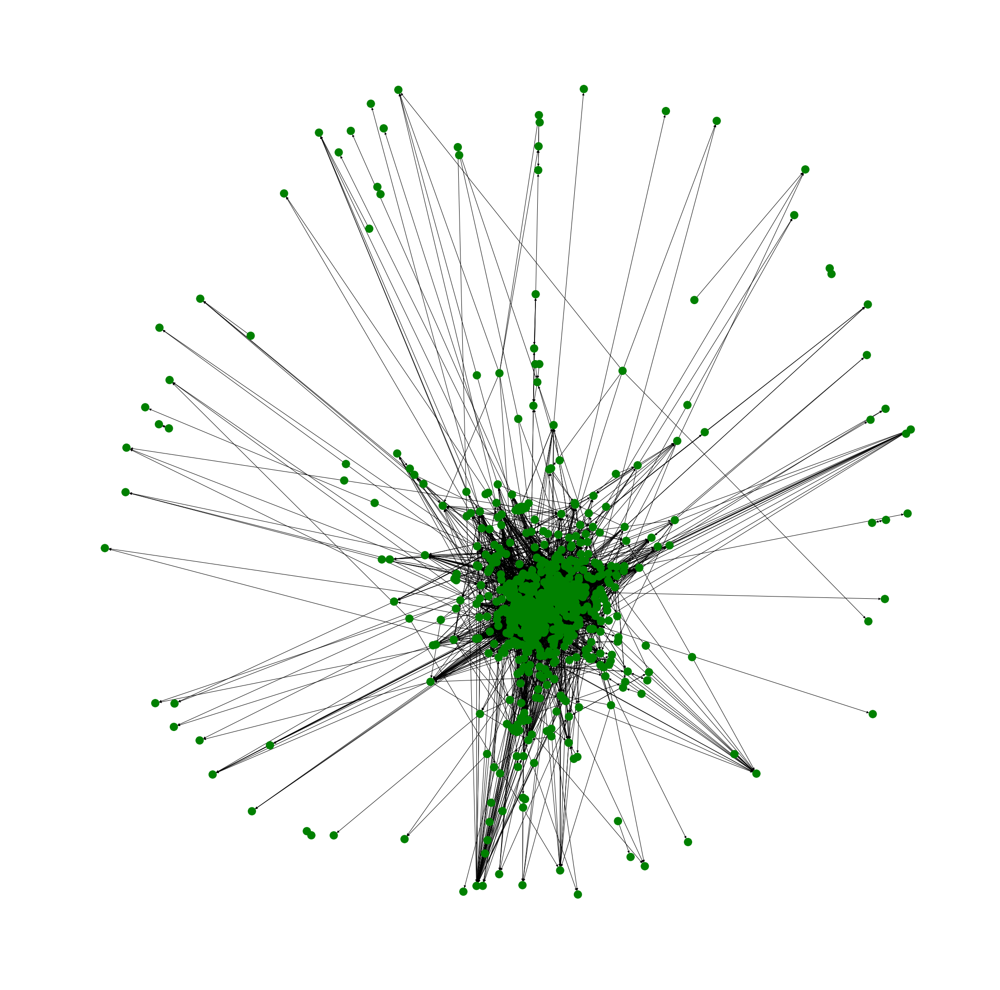

In [39]:
## poly_viz
plt.figure(figsize=(30,30))
nx.draw(G,node_color=color_map)
# plt.savefig(os.path.join(model_dir,"poly_users","following_network.pdf"))

In [ ]:
## mono viz≠

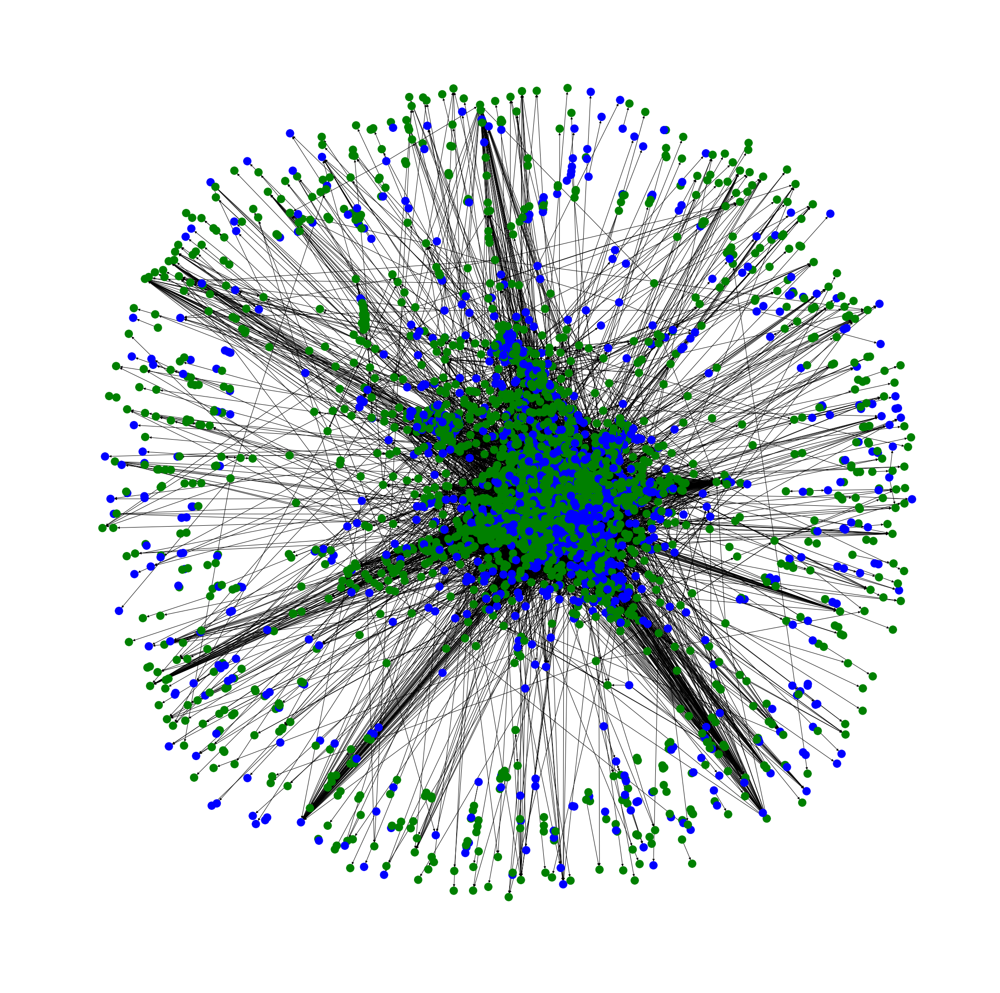

In [177]:
## old one  !! dont run
plt.figure(figsize=(30,30))
nx.draw(G,node_color=color_map)
plt.savefig("following_network.pdf")

## centrality

In [165]:
def partitions(nodes, n):
    "Partitions the nodes into n subsets"
    nodes_iter = iter(nodes)
    while True:
        partition = tuple(itertools.islice(nodes_iter,n))
        if not partition:
            return
        yield partition
 
# To begin the parallel computation, we initialize a Pool object with the
# number of available processors on our hardware. We then partition the
# network based on the size of the Pool object (the size is equal to the 
# number of available processors). 
def between_parallel(G, processes = None):
    p = Pool(processes=processes)
    part_generator = 4*len(p._pool)
    node_partitions = list(partitions(G.nodes(), int(len(G)/part_generator)))
    num_partitions = len(node_partitions)
 
    #Next, we pass each processor a copy of the entire network and 
    #compute #the betweenness centrality for each vertex assigned to the 
    #processor.
 
    bet_map = p.map(btwn_pool,
                    zip([G]*num_partitions,
                        [True]*num_partitions,
                        [None]*num_partitions,
                        node_partitions))
 
    #Finally, we collect the betweenness centrality calculations from each 
    #pool and aggregate them together to compute the overall betweenness 
    #centrality score for each vertex in the network.
 
    bt_c = bet_map[0]
    for bt in bet_map[1:]:
        for n in bt:
            bt_c[n] += bt[n]
    return bt_c


In [172]:
import networkx as nx
import matplotlib.pyplot as plt
import community
 
def detectCommunities(G_fb, layout):
 
	parts = community.best_partition(G_fb)
	values = [parts.get(node) for node in G_fb.nodes()]
 
	plt.axis("off")
	nx.draw_networkx(G_fb, pos = 'spring_pos', cmap = plt.get_cmap("jet"), node_color = values, node_size = 35, with_labels = False)
    
    

In [180]:
len(G_all.nodes())

2161

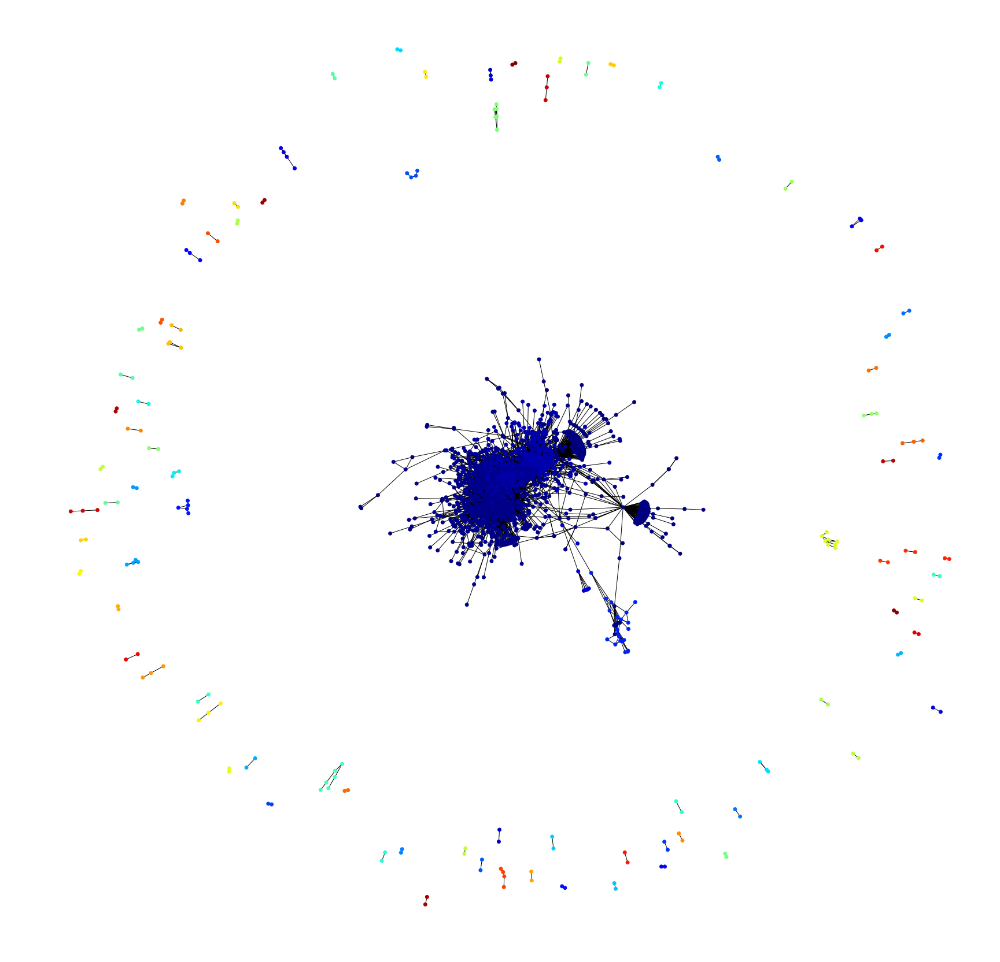

In [181]:
plt.figure(figsize=(30,30))
G_und = G_all.to_undirected()
parts = community.best_partition(G_und)
values = [parts.get(node) for node in G_und.nodes()]
plt.axis("off")
nx.draw_networkx(G_und, cmap = plt.get_cmap("jet"), node_color = values, node_size = 35, with_labels = False)
          

## Combine visualization:

In [49]:
G_und = G_all.to_undirected()
nx.average_clustering(G_und)

0.28041973903345485

In [74]:
print(nx.info(G_mono))

Name: 
Type: DiGraph
Number of nodes: 1145
Number of edges: 2672
Average in degree:   2.3336
Average out degree:   2.3336


In [75]:
print(nx.info(G_poly))

Name: 
Type: DiGraph
Number of nodes: 806
Number of edges: 15267
Average in degree:  18.9417
Average out degree:  18.9417


In [76]:
print(nx.info(G_all))

Name: 
Type: DiGraph
Number of nodes: 2161
Number of edges: 25884
Average in degree:  11.9778
Average out degree:  11.9778


In [85]:
G_ =  G_mono
pos = nx.spring_layout(G_)
betCent = nx.betweenness_centrality(G_, normalized=True, endpoints=True)
node_color = [20000.0 * G_.degree(v) for v in G_]
node_size =  [v * 10000 for v in betCent.values()]

In [86]:
sorted(betCent,key = betCent.get, reverse=True)[:5]

[15147042, 15391102, 20643565, 85650610, 23108704]

In [87]:
betCent[15147042]

0.06414068391988237

(-1.1790253360371574,
 0.8840285363910393,
 -1.0995765768459258,
 1.0518118864372117)

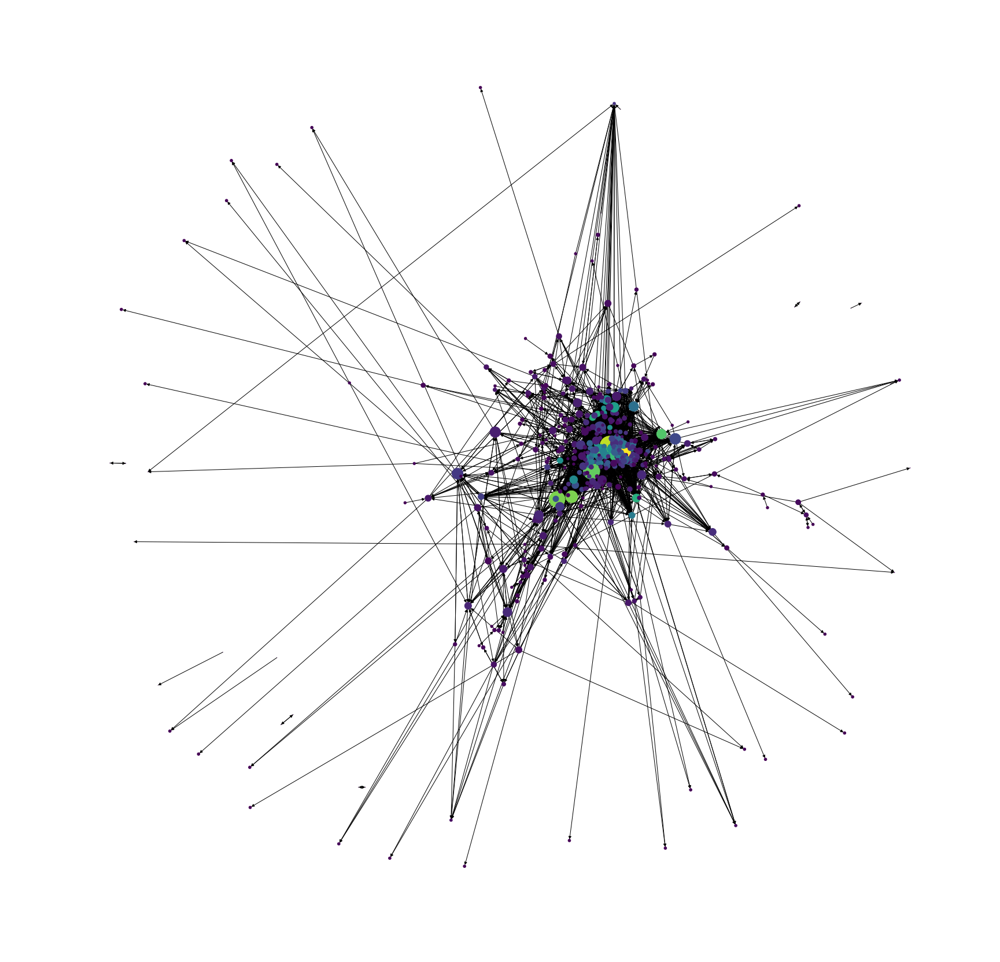

In [50]:
plt.figure(figsize=(30,30))
nx.draw_networkx(G_, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size )
plt.axis('off')

In [99]:
## highlight subgraphs
from matplotlib import pylab as pl

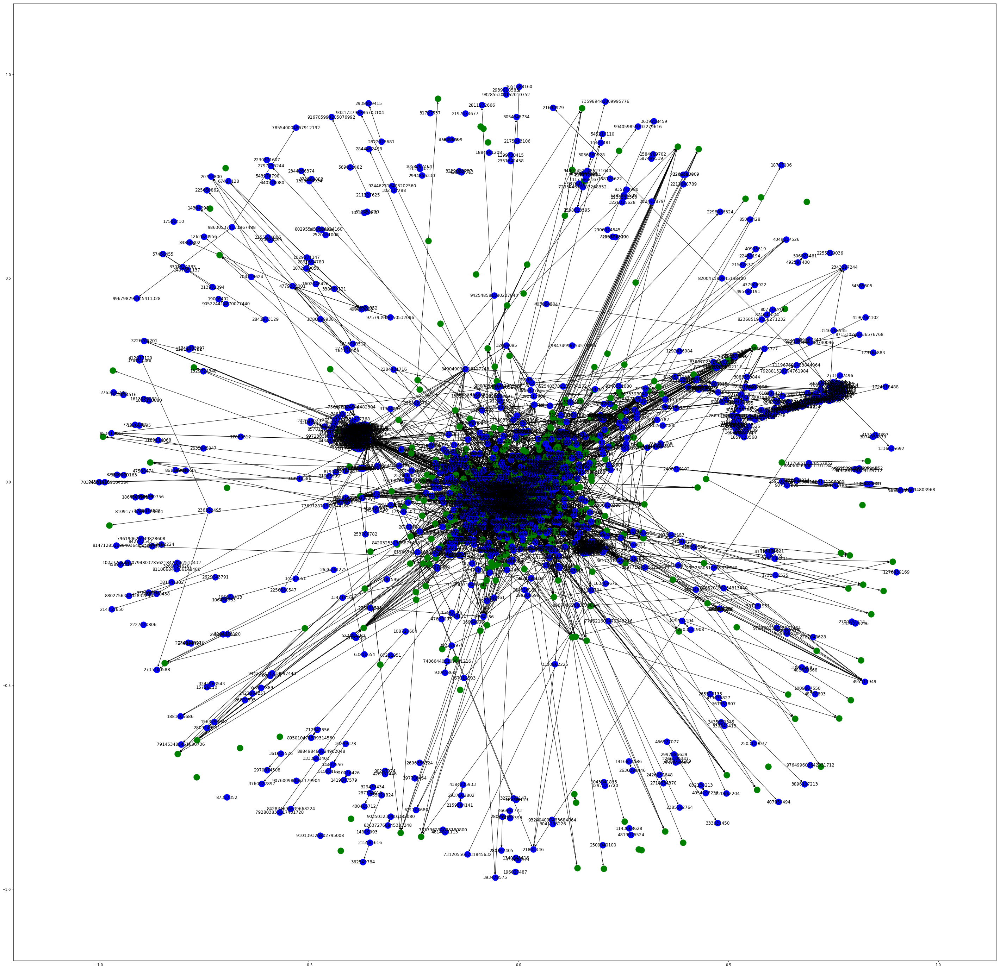

In [108]:
# G_all
# poly_users
pos = nx.spring_layout(G_all)
poly = G_all.subgraph(poly_users)
pl.figure(figsize=(50,50))
nx.draw_networkx(poly, pos=pos, node_color = 'green', with_labels= False)

mono = G_all.subgraph(mono_users)
nx.draw_networkx(mono, pos=pos, node_color = 'blue',with_label = False)
pl.show()

## graph statistics

In [135]:
x = (list(G.degree()))
x.sort(key= lambda x:x[1],reverse=False)

In [136]:
def get_deg_node(x):
    graphs_deg = dict()
    i = 0
    graphs_deg[0] = 0
    for node,degree in x:
        if ( degree <= (i+25)):
            graphs_deg[i] += 1
        else:
            i = i + 25
            graphs_deg[i] = 1
    return graphs_deg

In [137]:
graphs_deg = get_deg_node(x)

In [138]:
graphs_deg

{0: 532,
 25: 99,
 50: 38,
 75: 36,
 100: 21,
 125: 17,
 150: 15,
 175: 19,
 200: 8,
 225: 11,
 250: 8,
 275: 1,
 300: 1}

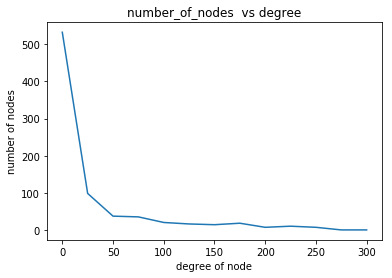

In [139]:
plt.title("number_of_nodes  vs degree")
plt.ylabel("number of nodes")
plt.xlabel("degree of node")
# plt.xticks(np.arange(0,400,100))
plt.plot(graphs_deg.keys(),graphs_deg.values())
plt.show()

In [140]:
def get_avg_deg(x):
    degrees = [degree for node,degree in x]
    avg_degree = sum(degrees) / len(x)
    return avg_degree

In [141]:
def get_poly_mono_deg(G):
    poly_deg = list()
    mono_deg = list()
    for node in G.nodes():
        if node in set(poly_users):
            poly_deg.append((node,G.degree(node)))
        else:
            mono_deg.append((node,G.degree(node)))
    return (poly_deg,mono_deg)

In [142]:
## mono
print(get_avg_deg(x))

37.883374689826304


In [143]:
print(nx.algorithms.wiener.wiener_index(G))

inf


In [144]:
print(nx.average_shortest_path_length(G))

NetworkXError: Graph is not weakly connected.

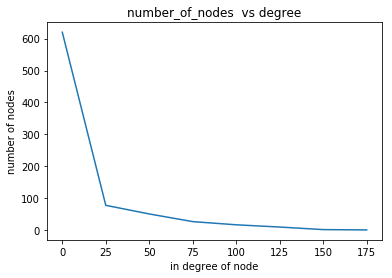

In [145]:
in_degree = list(G.in_degree())
in_degree.sort(key= lambda x:x[1],reverse=False)
indegree = get_deg_node(in_degree)
plt.title("number_of_nodes  vs degree")
plt.ylabel("number of nodes")
plt.xlabel("in degree of node")
# plt.xticks(np.arange(0,400,100))
plt.plot(indegree.keys(),indegree.values())
plt.show()

In [146]:
in_d = (list(G.in_degree()))
in_d.sort(key= lambda x:x[1],reverse=False)
out_d = (list(G.out_degree()))
out_d.sort(key= lambda x:x[1],reverse=False)
x = (list(G.degree()))
x.sort(key= lambda x:x[1],reverse=False)

In [147]:
print("avg degree " ,get_avg_deg(x))
print("avg in degree " ,get_avg_deg(in_d))
print("avg out degree " ,get_avg_deg(out_d))
# print("avg in degree poly " ,get_avg_deg(poly_deg))
# print("avg in degree mono " ,get_avg_deg(mono_deg))

avg degree  37.883374689826304
avg in degree  18.941687344913152
avg out degree  18.941687344913152


In [149]:
len(G.edges())

15267

In [150]:
out.sort(key= lambda x:x[1],reverse=False)
print("avg out degree " ,get_avg_deg(G.degrees()))
print("avg out degree poly " ,get_avg_deg(poly_deg))
print("avg out degree mono " ,get_avg_deg(mono_deg))

NameError: name 'out' is not defined

## using MICL to find communities and within it which are the poly1 and poly2 users

In [16]:
G = nx.read_gpickle(os.path.join(model_dir,"poly_users","following_net_new.gpickle"))

In [151]:
# getting the sparse matrix from the main graph
matrix = nx.to_scipy_sparse_matrix(G)

In [152]:
result = mc.run_mcl(matrix)

In [153]:
clusters = mc.get_clusters(result)  

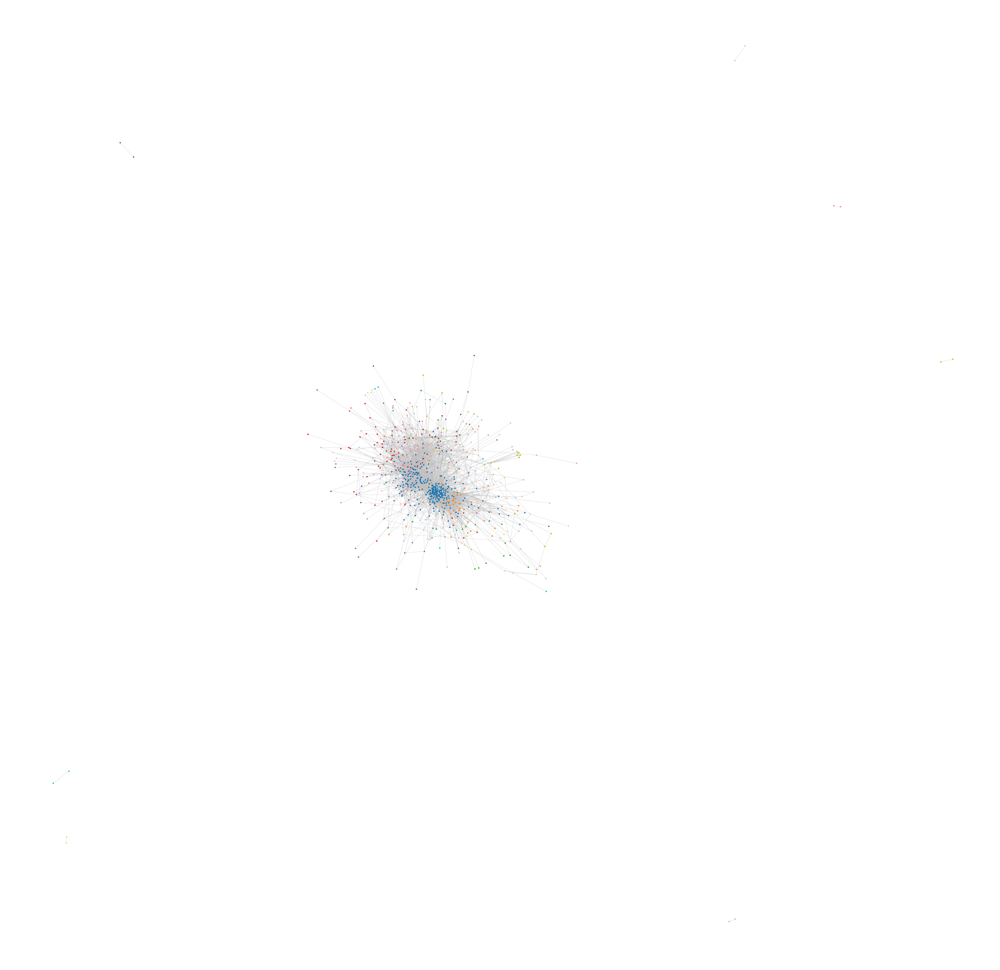

<Figure size 432x288 with 0 Axes>

In [156]:
## poly_viz
plt.figure(figsize=(100,100))
mc.draw_graph(matrix, clusters, node_size=50, with_labels=False, edge_color="silver")
file_name = os.path.join(model_dir,"poly_users","communities.pdf")
plt.savefig(file_name)

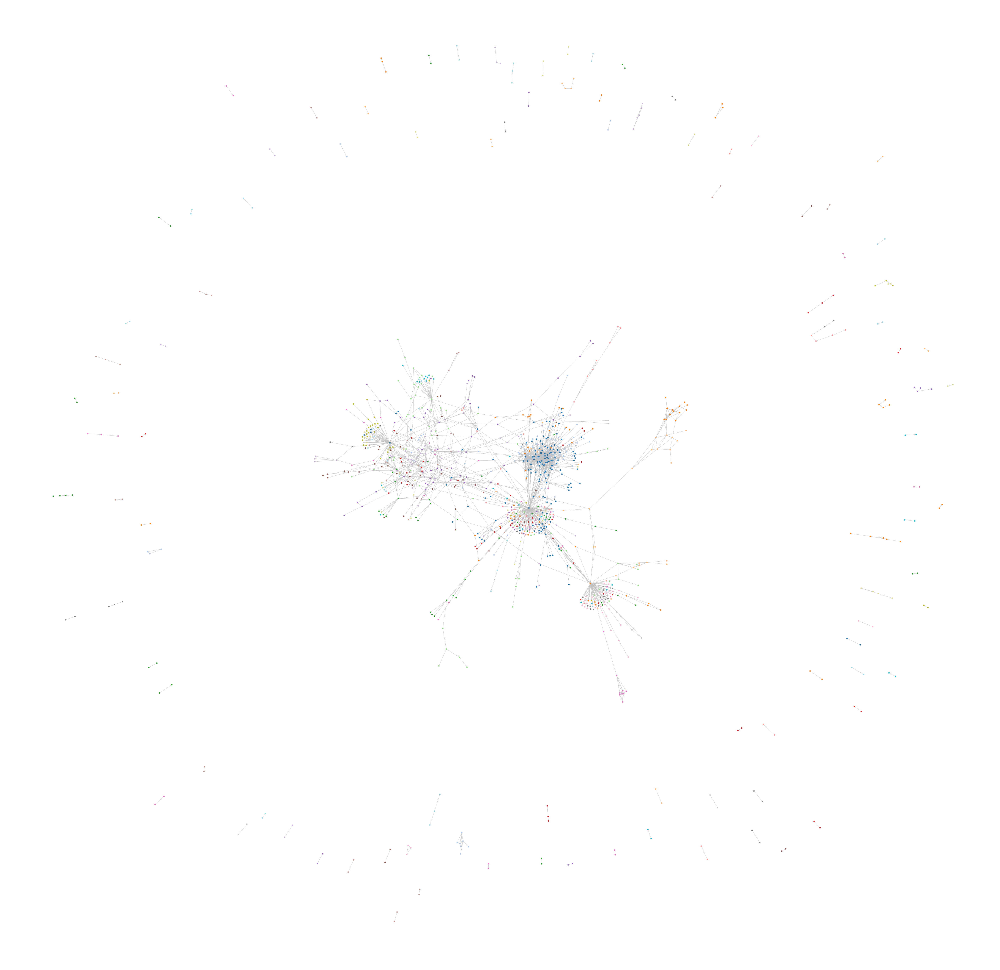

<Figure size 432x288 with 0 Axes>

In [69]:
## mono viz
plt.figure(figsize=(100,100))
mc.draw_graph(matrix, clusters, node_size=50, with_labels=False, edge_color="silver")
file_name = os.path.join(model_dir,"poly_users","communities.pdf")
plt.savefig(file_name)

In [23]:
len(G.nodes)

1775

/home/akshayuppal2345/.local/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


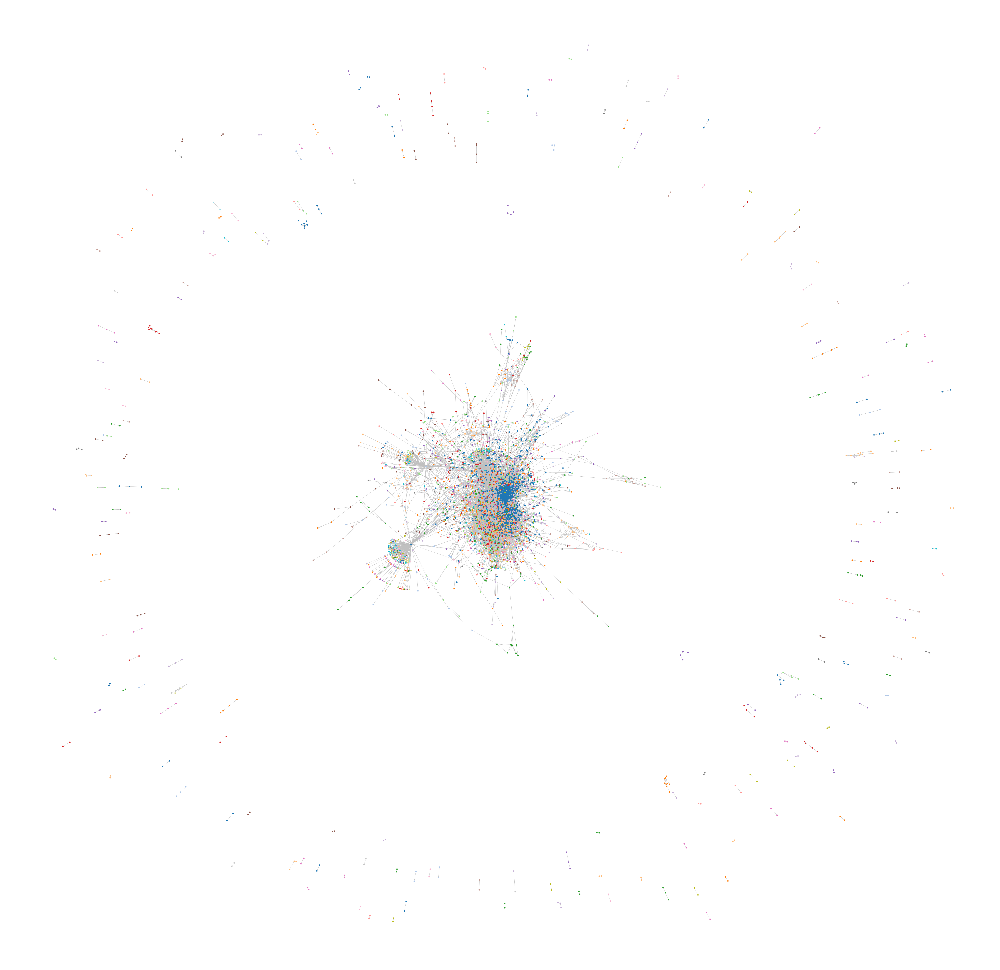

In [172]:
plt.figure(figsize=(100,100))
mc.draw_graph(matrix, clusters, node_size=50, with_labels=False, edge_color="silver")
plt.savefig("communities.pdf")

In [157]:
sub_clusters = [cluster for cluster in clusters if len(cluster) > 50]

In [158]:
# so there are 5 big clusters who have community size > 50
len(sub_clusters)

2

## changing the inflation parmeter

/home/akshayuppal2345/.local/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


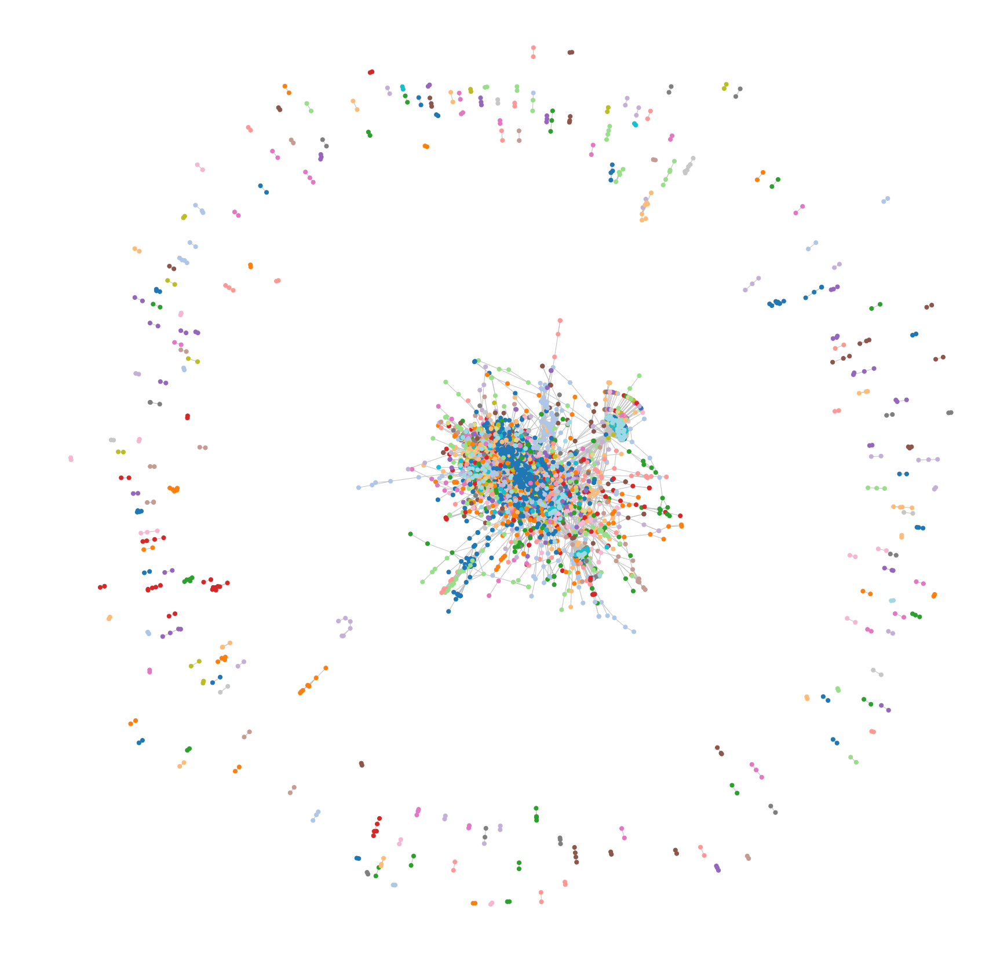

In [37]:
result = mc.run_mcl(matrix, inflation=1.4)
clusters = mc.get_clusters(result)
plt.figure(figsize=(30,30))
mc.draw_graph(matrix, clusters, node_size=50, with_labels=False, edge_color="silver")

In [ ]:
## adjusting the parameters
for inflation in tqdm([i / 10 for i in range(15, 26)]):
    result = mc.run_mcl(matrix, inflation=inflation)
    clusters = mc.get_clusters(result)
    Q = mc.modularity(matrix=result, clusters=clusters)
    print("inflation:", inflation, "modularity:", Q)

In [ ]:
# cluster using the optimized cluster inflation value
result = mc.run_mcl(matrix, inflation=2.1)
clusters = mc.get_clusters(result)
mc.draw_graph(matrix, clusters, pos=positions, node_size=50, with_labels=False, edge_color="silver")

In [127]:
## dump the graph
nx.write_gpickle(G, os.path.join(model_dir,"poly_users","following_network_new.gpickle"))